## This code identify cars on road
#### Author: Xia Shang
#### Date: 12/19/2017

In [493]:
import numpy as np
from numpy import *
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import scipy
import os, sys
import time
import glob
import tensorflow as tf
import math
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
import scipy.sparse.linalg as la
from scipy.ndimage.measurements import label
import itertools
%matplotlib inline

In [567]:
# Define a function that takes an image, a list of bounding boxes, 
# and optional color tuple and line thickness as inputs
# then draws boxes in that color on the output
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=1):
    # Make a copy of the image
    draw_img = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(draw_img, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return draw_img

In [3]:
# Define a function to compute color histogram features  
def bin_spatial(img, color_space='RGB', size=(32, 32)):
    # Convert image to new color space (if specified)
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)             
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(feature_image, size).ravel() 
    # Return the feature vector
    return features

In [4]:
# Define a function that takes an image
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

In [5]:
# Perform PCA by diagonalizing the coavariance
def pca_run( x, k):
    # Remove data mean
    xm = x - np.mean( x, axis=1, keepdims=True)
    # Get covariance estimate
    C = xm.dot( xm.T) / (xm.shape[1]-1)
    # Get top k PCA covariance eigenvectors/values
    v,u = scipy.sparse.linalg.eigsh( C, k=k)
    # Get overall transform and the input's projection to k dimensions
    w = diag( 1./sqrt(v)).dot( u.T) 
    y = w.dot( xm)
    return w,y

In [6]:
# Calculate the mean and variance of the training dataset after PCA and return the mean, diagonalized covariance matrix, and 
# inverted covariance matrix
def mean_invcov(x):    
    mu = mean (x, axis=1, keepdims=True)
    Cov = x.dot( x.T) / (x.shape[1]-1) 
    # choose the type of covariance matrix we want to use in this case
    # we use diagnol covariance matrix as the starting point.
    Cov_d = diag(diag(Cov))
    inv_C = np.linalg.inv(Cov_d)
    return mu, Cov_d, inv_C

In [7]:
# define the eqaution to calculate the determinant assuming gaussian
def gi(x, w, k, mu, co, ivco):
    g = -0.5*x.T.dot(ivco).dot(x)+0.5*x.T.dot(ivco).dot(mu) - 0.5*mu.T.dot(ivco).dot(mu) +0.5*mu.T.dot(ivco).dot(x) + np.log(w) - (k/2)*np.log(2*pi) - 0.5*np.log(np.linalg.det(co))
    return g

# the CrowdAI dataset

In [8]:
# based on the csv file, shuffle and split the dataset label into training and testing
def prep_train_test(df, r_train = 0.8, r_test = 0.1):
    df = shuffle(df).reset_index(drop=True)
    df_train = df[0:int(df.shape[0]*r_train)]
    df_test = df[int(df.shape[0]*r_train):int(df.shape[0]*(r_train+r_test))].reset_index(drop=True)
    return df_train, df_test

In [481]:
Test_path = os.getcwd() + '/object-detection-dataset_1' + '/labels.csv'
Test_path

'/Users/xiashang/Dropbox/Course/Machine_learning/Project/traffic_object_detection/object-detection-dataset_1/labels.csv'

In [482]:
label_all = pd.read_csv(Test_path)

In [483]:
label_all.head(10)

,xmin,xmax,ymin,ymax,Frame,Label,Preview URL
0,785,533,905,644,1479498371963069978.jpg,Car,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
1,89,551,291,680,1479498371963069978.jpg,Car,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
2,268,546,383,650,1479498371963069978.jpg,Car,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
3,455,522,548,615,1479498371963069978.jpg,Truck,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
4,548,522,625,605,1479498371963069978.jpg,Truck,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
5,1726,484,1919,646,1479498371963069978.jpg,Car,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
6,758,557,807,617,1479498371963069978.jpg,Car,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
7,633,561,680,597,1479498371963069978.jpg,Car,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
8,682,557,718,593,1479498371963069978.jpg,Car,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
9,710,540,836,665,1479498372942264998.jpg,Car,http://crowdai.com/images/c3AY-ptjXfT_oC9F/vis...


In [484]:
label_car = label_all.loc[(label_all['Label'] == 'Car')]
Car_train_label, Car_test_label = prep_train_test(label_car)

In [485]:
label_Trunk = label_all.loc[(label_all['Label'] == 'Truck')]
Trunk_train_label, Trunk_test_label = prep_train_test(label_Trunk)

In [486]:
label_Pedestrian = label_all.loc[(label_all['Label'] == 'Pedestrian')]
Pedestrian_train_label, Pedestrian_test_label = prep_train_test(label_Pedestrian)

In [538]:
Car_train = []
Car_test = []
Trunk_train = []
Trunk_test = []
Pedestrian_train = []
Pedestrian_test = []

In [539]:
# number of pictures in each category
n_Trunk = 500
n_Pedestrian = 500
n_Car = 2500
n_NotCar = 2500

In [540]:
for i in range(n_Trunk*2):
    path = 'object-detection-dataset_1/' + Trunk_train_label.iloc[i]['Frame']
    a, b, c, d = Trunk_train_label.iloc[i][0:4]
    image = cv2.imread(path)
    image_object = cv2.resize(image[b:d,a:c,:], (64, 64))
    Trunk_train.append(image_object)

In [541]:
for i in range(n_Car*2):
    path = 'object-detection-dataset_1/' + Car_train_label.iloc[i]['Frame']
    a, b, c, d = Car_train_label.iloc[i][0:4]
    image = cv2.imread(path)
    image_object = cv2.resize(image[b:d,a:c,:], (64, 64))
    Car_train.append(image_object)

In [542]:
for i in range(n_Pedestrian*2):
    path = 'object-detection-dataset_1/' + Pedestrian_train_label.iloc[i]['Frame']
    a, b, c, d = Pedestrian_train_label.iloc[i][0:4]
    image = cv2.imread(path)
    image_object = cv2.resize(image[b:d,a:c,:], (64, 64))
    Pedestrian_train.append(image_object)

error: /Users/travis/build/skvark/opencv-python/opencv/modules/imgproc/src/imgwarp.cpp:3483: error: (-215) ssize.width > 0 && ssize.height > 0 in function resize


# Step 0: prepare non-car training dataset, based on the GTI vehicle image database and KITTI vision benchmark suite

In [543]:
def initialize_data(path):
    data = []
    files = glob.glob(path)
    # prepare training dataset for non-cars
    for i in files:
        image = np.array(cv2.imread(i))
        data.append(image)    
    return data

In [544]:
Notcar_train = []
Notcar_test = []

In [545]:
path = os.getcwd()
path_notcar_train = path + '/non-vehicles' + '/Extras/*.png'
NotCar_train = initialize_data(path_notcar_train)
NotCar_train = shuffle(NotCar_train, random_state=0)

In [546]:
len(NotCar_train)

5068

### Raw image processing

<function matplotlib.pyplot.show>

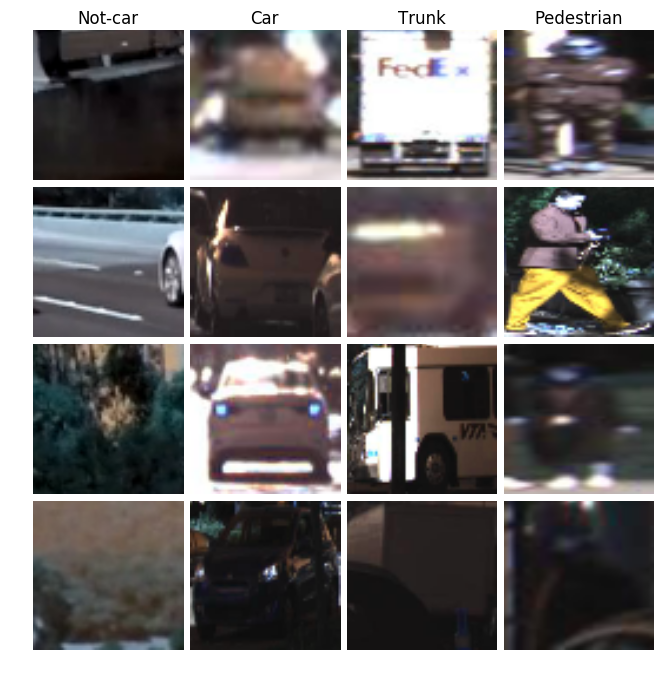

In [547]:
# Show initial images after resize
# plot the first 4 images in the training dataset for each class
fig, axs = plt.subplots(4, 4, figsize = (8, 8))
fig.subplots_adjust(hspace = .05, wspace = .05)
for i, ax in enumerate(axs.flatten()):
    if i==0:
            ax.set_title('Not-car')
    if i==1:
            ax.set_title('Car')
    if i==2:
            ax.set_title('Trunk')
    if i==3:
            ax.set_title('Pedestrian')
    if int(i%4)==0:
        ax.imshow(NotCar_train[int(i/4)])
    if int(i%4)==1:
        ax.imshow(Car_train[int(i/4)])
    if int(i%4)==2:
        ax.imshow(Trunk_train[int(i/4)])
    if int(i%4)==3:
        ax.imshow(Pedestrian_train[int(i/4)])
    ax.axis("off")
fig.savefig('raw_image.jpg')
plt.show

In [548]:
# convert to gray scale
def gray(x):
    image = []
    for i in x:
        i = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
        image.append(i)
    return np.array(image)

In [549]:
# convert to gray-scale
Car_train = gray(Car_train)
Trunk_train = gray (Trunk_train)
Pedestrian_train = gray(Pedestrian_train)
NotCar_train = gray(NotCar_train)

<function matplotlib.pyplot.show>

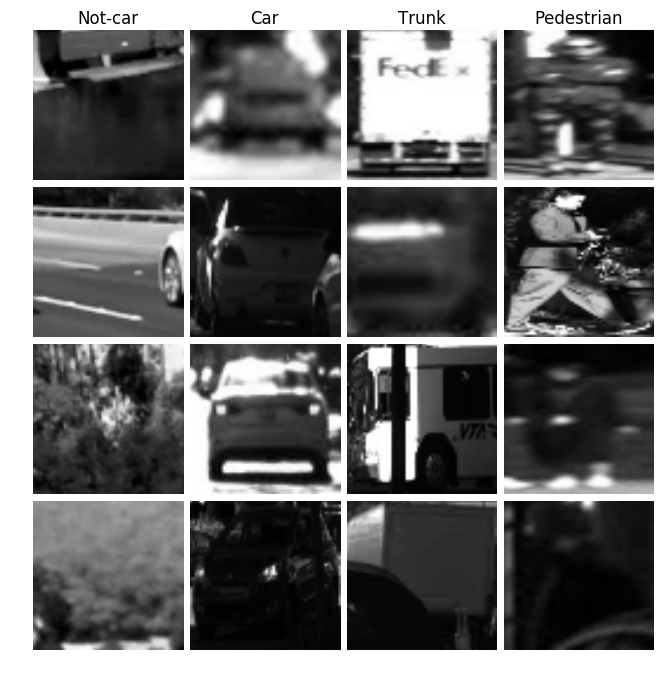

In [552]:
# Show initial images after converting to gray scale
# plot the first 4 images in the training dataset for each class
fig, axs = plt.subplots(4, 4, figsize = (8, 8))
fig.subplots_adjust(hspace = .05, wspace = .05)
for i, ax in enumerate(axs.flatten()):
    if i==0:
            ax.set_title('Not-car')
    if i==1:
            ax.set_title('Car')
    if i==2:
            ax.set_title('Trunk')
    if i==3:
            ax.set_title('Pedestrian')
    if int(i%4)==0:
        ax.imshow(NotCar_train[int(i/4)], cmap = 'gray')
    if int(i%4)==1:
        ax.imshow(Car_train[int(i/4)], cmap = 'gray')
    if int(i%4)==2:
        ax.imshow(Trunk_train[int(i/4)], cmap = 'gray')
    if int(i%4)==3:
        ax.imshow(Pedestrian_train[int(i/4)], cmap = 'gray')
    ax.axis("off")
fig.savefig('gray_scale_image.jpg')
plt.show

In [554]:
# image preprocessing using CLAHE on gray image
def preprocessing(x):
    # create a CLAHE object (Arguments are optional).
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    image = []
    for i in x:
        #i = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
        image.append(clahe.apply(i))
    return np.array(image)

In [557]:
# adjust contrast
Car_train = preprocessing(Car_train)
Trunk_train = preprocessing (Trunk_train)
Pedestrian_train = preprocessing(Pedestrian_train)
NotCar_train = preprocessing(NotCar_train)

<function matplotlib.pyplot.show>

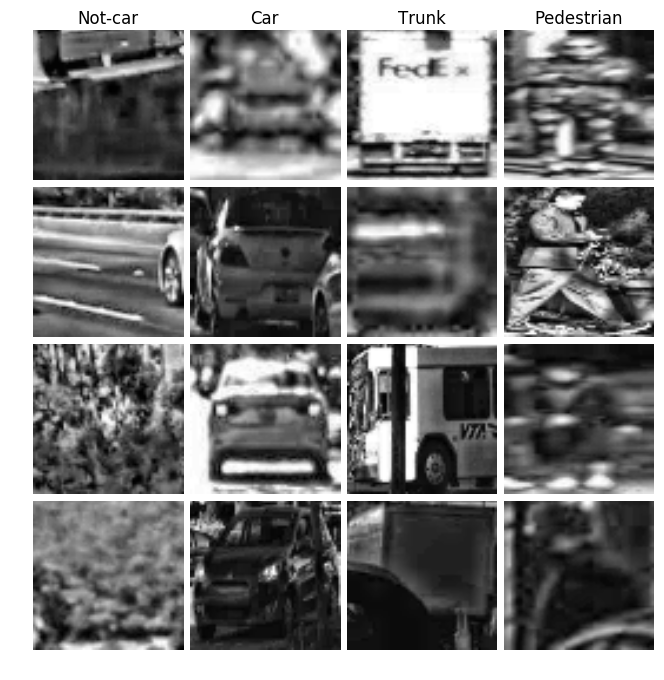

In [561]:
# Show initial images after adjusting contrast
# plot the first 4 images in the training dataset for each class
fig, axs = plt.subplots(4, 4, figsize = (8, 8))
fig.subplots_adjust(hspace = .05, wspace = .05)
for i, ax in enumerate(axs.flatten()):
    if i==0:
            ax.set_title('Not-car')
    if i==1:
            ax.set_title('Car')
    if i==2:
            ax.set_title('Trunk')
    if i==3:
            ax.set_title('Pedestrian')
    if int(i%4)==0:
        ax.imshow(NotCar_train[int(i/4)], cmap = 'gray')
    if int(i%4)==1:
        ax.imshow(Car_train[int(i/4)], cmap = 'gray')
    if int(i%4)==2:
        ax.imshow(Trunk_train[int(i/4)], cmap = 'gray')
    if int(i%4)==3:
        ax.imshow(Pedestrian_train[int(i/4)], cmap = 'gray')
    ax.axis("off")
fig.savefig('adjust_contrast_image.jpg')
plt.show

In [ ]:
# split to training and validation set
Car_test = Car_train[n_Car:n_Car*2].astype('float32')
Car_train = Car_train[0:n_Car].astype('float32')
Trunk_test = Trunk_train[n_Trunk:n_Trunk*2].astype('float32')
Trunk_train = Trunk_train[0:n_Trunk].astype('float32')
Pedestrian_test = Pedestrian_train[n_Pedestrian:n_Pedestrian*2].astype('float32')
Pedestrian_train = Pedestrian_train[0:n_Pedestrian].astype('float32')
NotCar_train = NotCar[0:n_NotCar]
NotCar_test = NotCar[n_NotCar:n_NotCar*2]

### Dataset Summary & Exploration

<function matplotlib.pyplot.show>

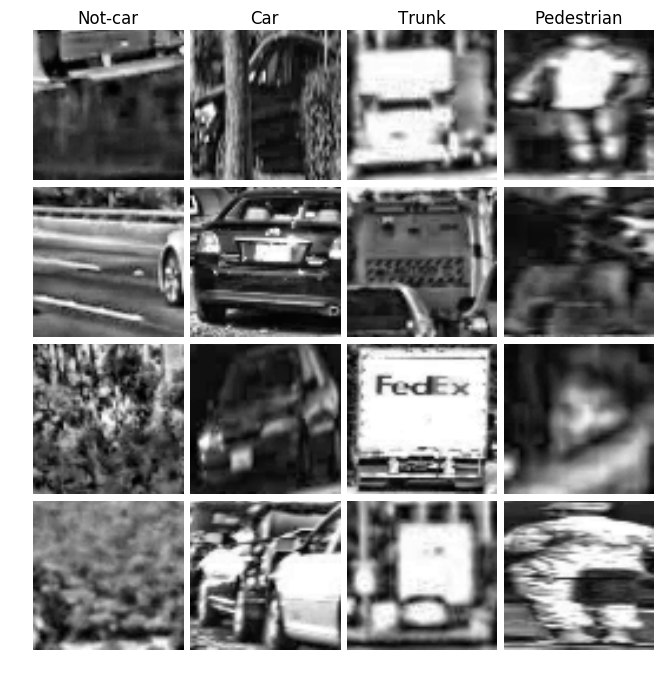

In [79]:
# plot the first 4 images in the training dataset for each class
fig, axs = plt.subplots(4, 4, figsize = (8, 8))
fig.subplots_adjust(hspace = .05, wspace = .05)
for i, ax in enumerate(axs.flatten()):
    if i==0:
            ax.set_title('Not-car')
    if i==1:
            ax.set_title('Car')
    if i==2:
            ax.set_title('Trunk')
    if i==3:
            ax.set_title('Pedestrian')
    if int(i%4)==0:
        ax.imshow(NotCar_train[int(i/4)], cmap = 'gray')
    if int(i%4)==1:
        ax.imshow(Car_train[int(i/4)], cmap = 'gray')
    if int(i%4)==2:
        ax.imshow(Trunk_train[int(i/4)], cmap = 'gray')
    if int(i%4)==3:
        ax.imshow(Pedestrian_train[int(i/4)], cmap = 'gray')
    ax.axis("off")
#fig.savefig('Gray-scale_raw_image.png')
plt.show

In [ ]:
# plot the first 4 images in the training dataset for each class
fig, axs = plt.subplots(4, 4, figsize = (8, 8))
fig.subplots_adjust(hspace = .05, wspace = .05)
for i, ax in enumerate(axs.flatten()):
    if i==0:
            ax.set_title('Not-car')
    if i==1:
            ax.set_title('Car')
    if i==2:
            ax.set_title('Trunk')
    if i==3:
            ax.set_title('Pedestrian')
    if int(i%4)==0:
        ax.imshow(NotCar[int(i/4)])
    if int(i%4)==1:
        ax.imshow(Car_train[int(i/4)])
    if int(i%4)==2:
        ax.imshow(Trunk_train[int(i/4)])
    if int(i%4)==3:
        ax.imshow(Pedestrian_train[int(i/4)])
    ax.axis("off")
#fig.savefig('Gray-scale_raw_image.png')
plt.show

### prepare training and validation data and labels

In [84]:
X_train = np.vstack((NotCar_train, Car_train, Trunk_train, Pedestrian_train))
Train_label = np.zeros((X_train.shape[0],4), dtype = 'float32')

In [88]:
Train_label[0:n_NotCar,0] = 1
Train_label[n_NotCar:n_NotCar + n_Car,1] = 1
Train_label[n_NotCar + n_Car:n_NotCar + n_Car + n_Trunk,2] = 1
Train_label[n_NotCar + n_Car + n_Trunk:n_NotCar + n_Car + n_Trunk + n_Pedestrian,3] = 1

In [89]:
X_valid = np.vstack((NotCar_test, Car_test, Trunk_test, Pedestrian_test))
Valid_label = Train_label

In [90]:
X_train, Train_label = shuffle(X_train, Train_label, random_state=0)
X_valid, Valid_label = shuffle(X_valid, Valid_label, random_state=0)

In [559]:
# normalization, all pixel normalized to the range of -1 to 1
def normalized_pixel(x):
    return 2.0*x/256.-1.

In [92]:
X_train = normalized_pixel(X_train)
X_valid = normalized_pixel(X_valid)

### old approach

In [40]:
# generate edges for images
def edges(img):
    # got the edges of cars
    low_threshold = 80
    high_threshold = 120
    edge = []
    for i in img.reshape(-1,64,64,3):
        a = cv2.Canny(np.uint8(i), low_threshold, high_threshold)
        edge.append(a)
    edge = np.array(edge).astype('float32')
    return edge  

In [64]:
Train_feature_edge = edges(Train_feature*255).reshape(-1,64*64)/255
Validate_feature_edge = edges(Validate_feature*255).reshape(-1,64*64)/255

In [55]:
Train_feature_edge.shape

(6000, 4096)

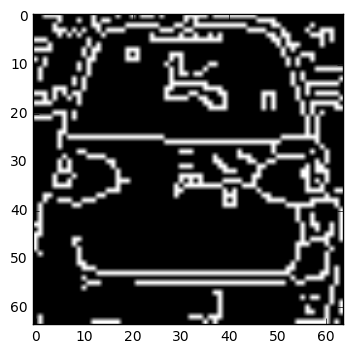

In [44]:
Car_edge = edges(Car_train[0:30])
Trunk_edge = edges(Trunk_train[0:30])
NotCar_edge = edges(NotCar_train[0:30])
People_edge = edges(Pedestrian_train[0:30])
plt.imshow(Car_edge[17], 'gray')

In [546]:
# got the edges of cars
low_threshold = 80
high_threshold = 120
edge = []
for i in Train_feature.reshape(-1,64,64,3)*255:
    a = cv2.Canny(np.uint8(i), low_threshold, high_threshold)
    eadge.append(a)
edge = np.array(edge).astype('float32').reshape(-1, 64*64)


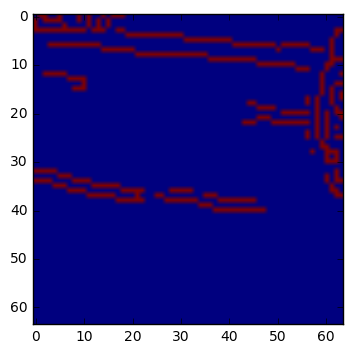

In [553]:
# plot the edges for notcars, cars, trucks, and people
notcar_edge = []
for i in Train_feature.reshape(-1,64,64,3)*255:
    a = cv2.Canny(np.uint8(i), low_threshold, high_threshold)
    edge.append(a)
edge = np.array(edge).astype('float32').reshape(-1, 64*64)

# pca

In [116]:
Train_feature_gray.shape

(6000, 4096)

In [179]:
a, b=pca_run(np.transpose(Train_feature/255), 100)
Train_feature_pca = transpose(b)

In [188]:
a, b=pca_run(np.transpose(Validate_feature/255), 100)
Validate_feature_pca = transpose(b)

In [136]:
a, b =pca(Train_feature/255, 100)
Validate_feature_pca = np.transpose(a)

In [142]:
from sklearn.decomposition import PCA
# determine how many components will be needed to represent over 60% of the total information (accumulative covariance)
pca = PCA(n_components = 100)
pca.fit(Train_feature)

PCA(copy=True, n_components=100, whiten=False)

<function matplotlib.pyplot.show>

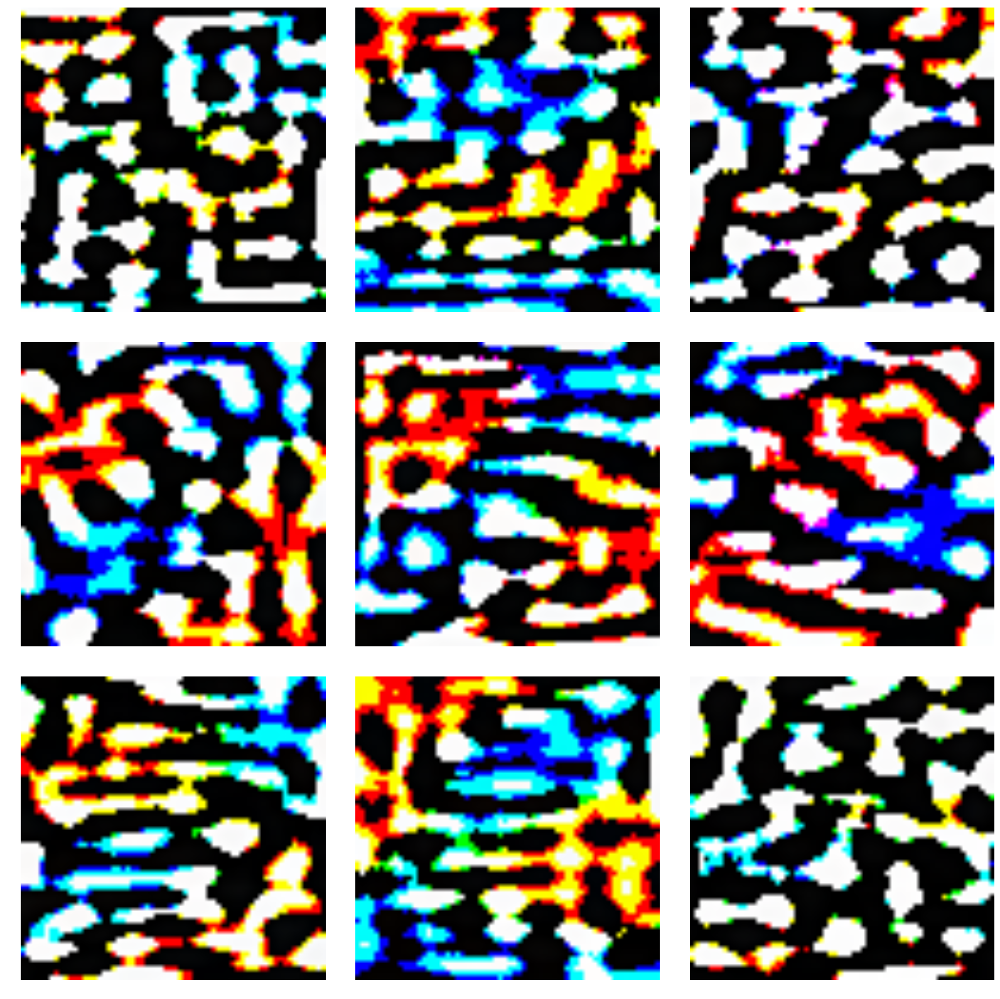

In [184]:
# plot the image of cars in the training data, plot the first 9 imiages as an example
fig, axs = plt.subplots(3, 3, figsize = (20, 20))
fig.subplots_adjust(hspace = .1, wspace = .1)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(a[i].reshape((64,64,3)))
    ax.axis("off")
#fig.savefig('pca_weights.png')
plt.show

# plot raw and edge features

<function matplotlib.pyplot.show>

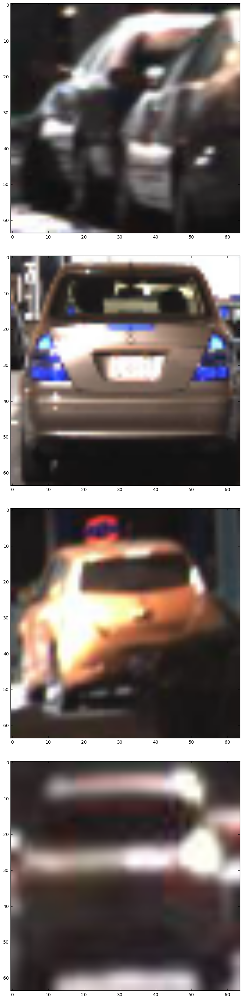

In [614]:
# plot the image of cars in the training data, plot the first 9 imiages as an example
fig, axs = plt.subplots(4, 1, figsize = (40, 40))
fig.subplots_adjust(hspace = .1, wspace = .1)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(Car_train[i+9].reshape((64,64,3))/255)
    #ax.axis("off")
#fig.savefig('car_train_edge_0.png')
plt.show

<function matplotlib.pyplot.show>

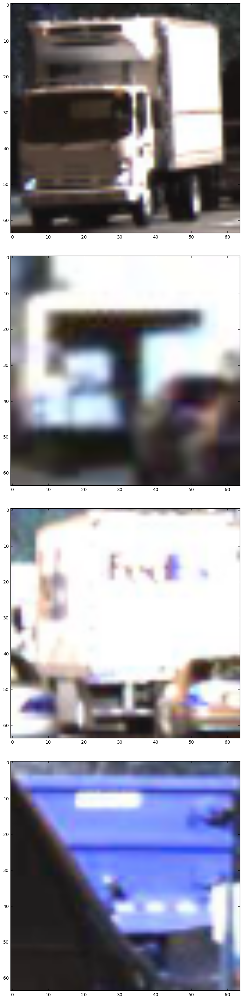

In [603]:
# plot the image of cars in the training data, plot the first 9 imiages as an example
fig, axs = plt.subplots(4, 1, figsize = (40, 40))
fig.subplots_adjust(hspace = .1, wspace = .1)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(Trunk_train[i].reshape((64,64,3))/255)
    #ax.axis("off")
#fig.savefig('car_trunk_raw_0.png')
plt.show

<function matplotlib.pyplot.show>

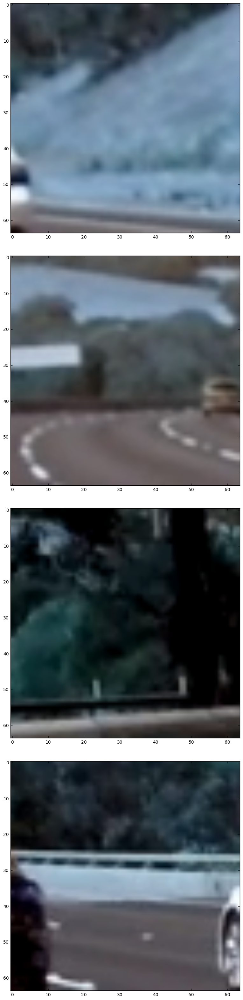

In [609]:
# plot the image of cars in the training data, plot the first 9 imiages as an example
fig, axs = plt.subplots(4, 1, figsize = (40, 40))
fig.subplots_adjust(hspace = .1, wspace = .1)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(NotCar_train[i+5].reshape((64,64,3))/255)
    #ax.axis("off")
fig.savefig('car_notcar_raw_0.png')
plt.show

<function matplotlib.pyplot.show>

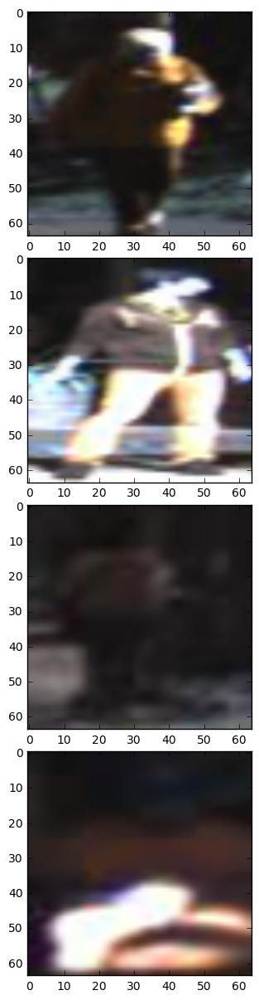

In [611]:
# plot the image of cars in the training data, plot the first 9 imiages as an example
fig, axs = plt.subplots(4, 1, figsize = (15, 15))
fig.subplots_adjust(hspace = .1, wspace = .1)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(Pedestrian_train[i+5].reshape((64,64,3))/255)
    #ax.axis("off")
fig.savefig('car_people_raw_0.png')
plt.show

<function matplotlib.pyplot.show>

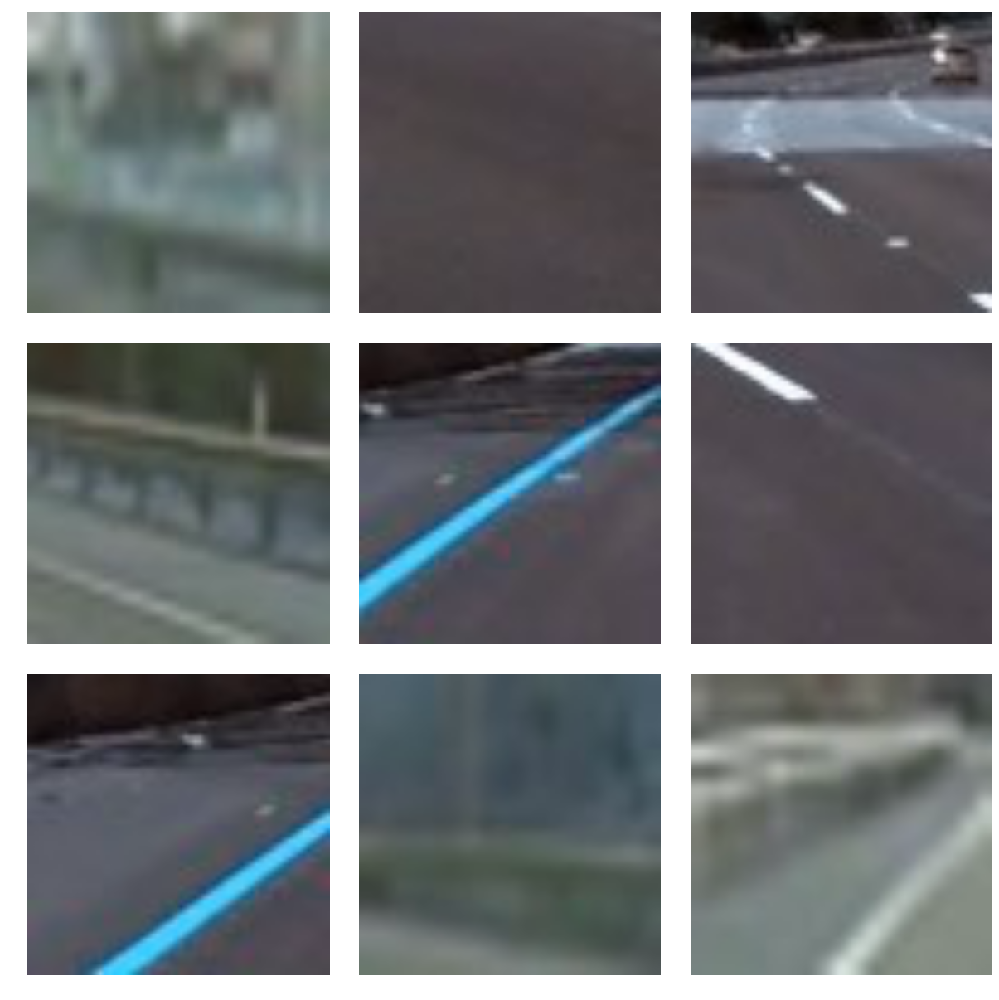

In [34]:
# plot the image of not-cars in the training data, plot the first 9 imiages as an example
fig, axs = plt.subplots(3, 3, figsize = (15, 15))
fig.subplots_adjust(hspace = .1, wspace = .1)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(NotCar_train[i].reshape((64,64,3))/255)
    ax.axis("off")
#fig.savefig('notcar_train.png')
plt.show

<function matplotlib.pyplot.show>

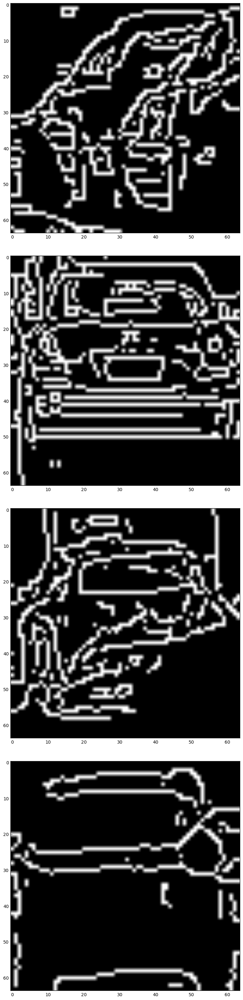

In [616]:
# plot the image of cars in the training data, plot the first 9 imiages as an example
fig, axs = plt.subplots(4, 1, figsize = (40, 40))
fig.subplots_adjust(hspace = .1, wspace = .1)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(Car_edge[i+9], 'gray')
    #ax.axis("off")
fig.savefig('car_train_edge_0.png')
plt.show

<function matplotlib.pyplot.show>

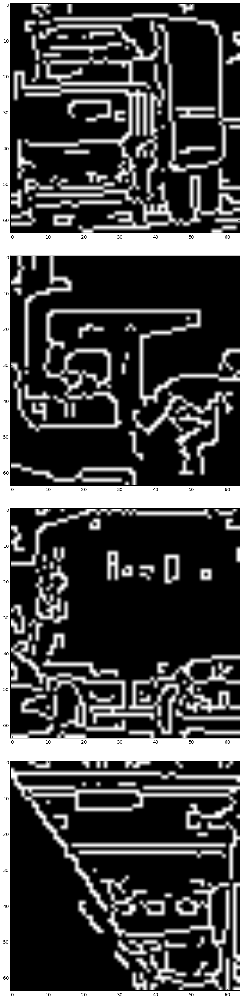

In [618]:
# plot the image of cars in the training data, plot the first 9 imiages as an example
fig, axs = plt.subplots(4, 1, figsize = (40, 40))
fig.subplots_adjust(hspace = .1, wspace = .1)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(Trunk_edge[i],'gray')
    #ax.axis("off")
fig.savefig('car_trunk_edge_0.png')
plt.show

<function matplotlib.pyplot.show>

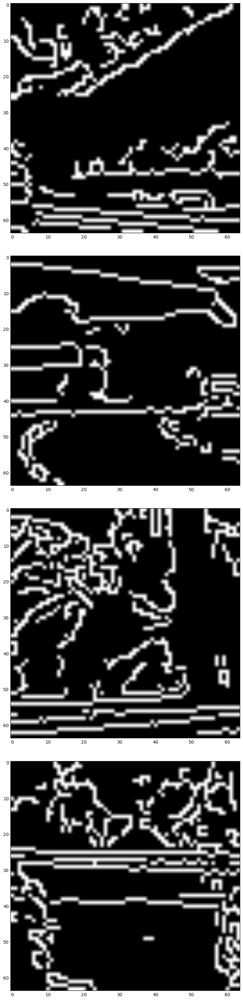

In [620]:
# plot the image of cars in the training data, plot the first 9 imiages as an example
fig, axs = plt.subplots(4, 1, figsize = (40, 40))
fig.subplots_adjust(hspace = .1, wspace = .1)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(NotCar_edge[i+5],'gray')
    #ax.axis("off")
fig.savefig('car_notcar_edge_0.png')
plt.show

<function matplotlib.pyplot.show>

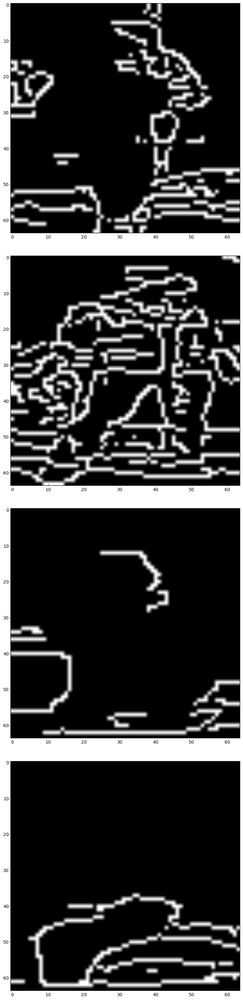

In [622]:
# plot the image of cars in the training data, plot the first 9 imiages as an example
fig, axs = plt.subplots(4, 1, figsize = (40, 40))
fig.subplots_adjust(hspace = .1, wspace = .1)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(People_edge[i+5], 'gray')
    #ax.axis("off")
fig.savefig('car_people_edge_0.png')
plt.show

<function matplotlib.pyplot.show>

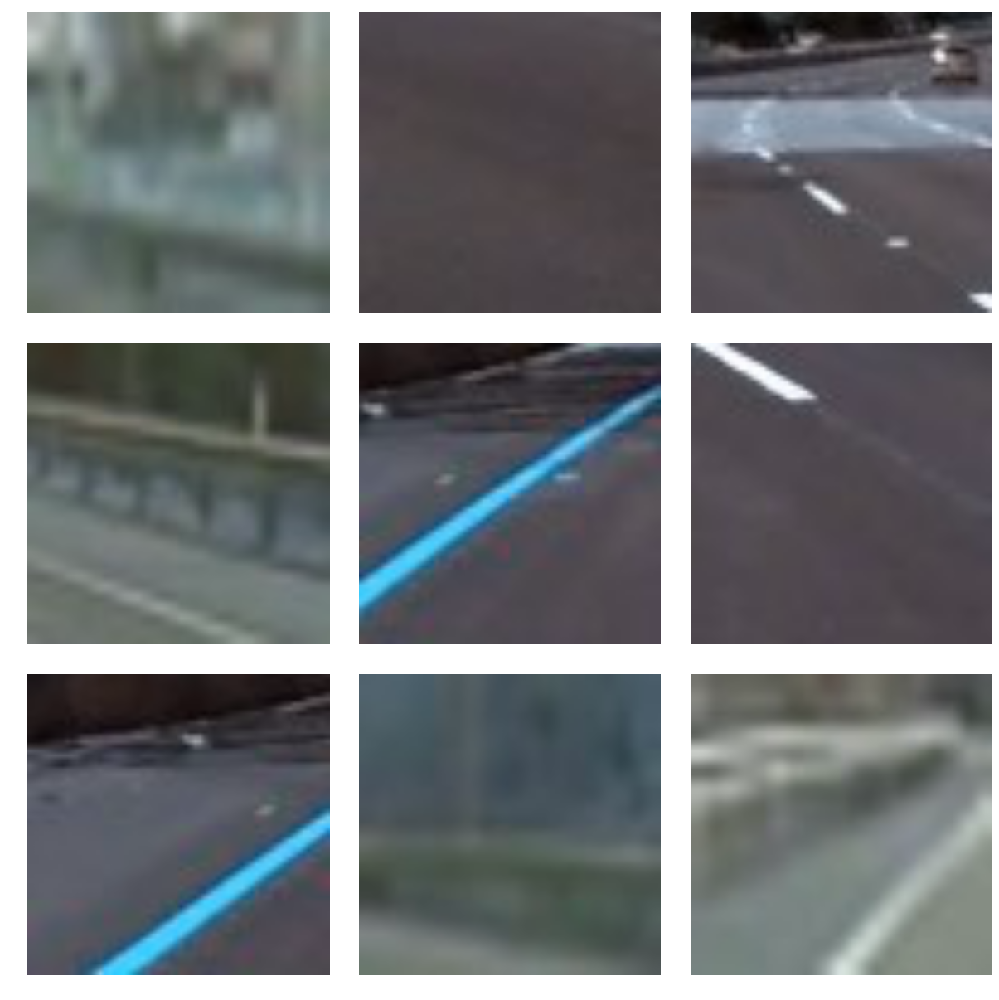

In [34]:
# plot the image of not-cars in the training data, plot the first 9 imiages as an example
fig, axs = plt.subplots(3, 3, figsize = (15, 15))
fig.subplots_adjust(hspace = .1, wspace = .1)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(NotCar_train[i].reshape((64,64,3))/255)
    ax.axis("off")
#fig.savefig('notcar_train.png')
plt.show

### Model Architecture

#### The model is modified from the classical LeNet-5 CNN.  The model architecture is listed in the following table
| Layers       | Size         | Activation   |
|:------------:|:------------:|:------------:|
|Input|64x64x1||
|Conv1|32x32x6, same padding, strike = 2|elu|
|Max pooling|16x16x6||
|Conv2|16x16x16, same padding, strike = 1|elu|
|Max pooling|8x8x16||
|L1, fully connected| 1024|elu|
|Dropout|||
|L2, fully connected| 512|elu|
|Dropout|||
|L3, fully connected| 4| softmax_cross_entropy|



| Layers       | Size         | Activation   |
|:------------:|:------------:|:------------:|
|Input|64x64x1||
|Conv1|32x32x6|elu|
|Max pooling|16x16x6||
|Conv2|16x16x16|elu|
|Max pooling|8x8x16||
|L1, fully connected| 1024|elu|
|Dropout|||
|L2, fully connected| 512|elu|
|Dropout|||
|L3, fully connected| 4| softmax_cross_entropy|




In [132]:
# Hyperparameters
mu = 0
sigma = 0.1
drop_out_prob = 0.6
n_classes = 4

In [133]:
# Features and Labels
features = tf.placeholder(tf.float32, [None, 64, 64])
labels = tf.placeholder(tf.float32, [None, n_classes])
keep_prob = tf.placeholder(tf.float32)

In [134]:
input_layer = tf.reshape(features, [-1, 64, 64, 1])
# SOLUTION: Layer 1: Convolutional. Input = 64x64x1. Output = 32x32x1x6.
conv1_W = tf.Variable(tf.truncated_normal(shape=(5, 5, 1, 6), mean = mu, stddev = sigma))
conv1_b = tf.Variable(tf.zeros(6))
conv1   = tf.nn.conv2d(input_layer, conv1_W, strides=[1, 2, 2, 1], padding='SAME') + conv1_b

# Activation.
conv1 = tf.nn.elu(conv1)

# Pooling. Input = 32x32x1x6. Output = 16x16x1x6.
conv1_pool = tf.nn.max_pool(conv1, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')

# Layer 2: Convolutional. Output = 32x32x1x16.
conv2_W = tf.Variable(tf.truncated_normal(shape=(5, 5, 6, 16), mean = mu, stddev = sigma))
conv2_b = tf.Variable(tf.zeros(16))
conv2   = tf.nn.conv2d(conv1_pool, conv2_W, strides=[1, 1, 1, 1], padding='SAME') + conv2_b

# Activation.
conv2 = tf.nn.elu(conv2)

# Pooling. Input = 16x16x16. Output = 8x8x16.
conv2_pool = tf.nn.max_pool(conv2, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')

# Flatten. Input = 16x16x16. Output = 1024.
fc0   = tf.reshape(conv2_pool,[tf.shape(conv2)[0], 1024])

# Layer 3: Fully Connected. Input = 1024. Output = 512.
fc1_W = tf.Variable(tf.truncated_normal(shape=(1024, 512), mean = mu, stddev = sigma))
fc1_b = tf.Variable(tf.zeros(512))
fc1   = tf.matmul(fc0, fc1_W) + fc1_b

# Activation.
fc1    = tf.nn.elu(fc1)

# Dropout
fc1 = tf.nn.dropout(fc1, keep_prob)

# Layer 4: Fully Connected. Input = 512. Output = 120.
fc2_W  = tf.Variable(tf.truncated_normal(shape=(512, 120), mean = mu, stddev = sigma))
fc2_b  = tf.Variable(tf.zeros(120))
fc2    = tf.matmul(fc1, fc2_W) + fc2_b

# Activation.
fc2    = tf.nn.elu(fc2)

# Dropout
fc2 = tf.nn.dropout(fc2, keep_prob)

# Layer 5: Fully Connected. Input = 120. Output = n_classes.
fc3_W  = tf.Variable(tf.truncated_normal(shape=(120, n_classes), mean = mu, stddev = sigma))
fc3_b  = tf.Variable(tf.zeros(n_classes))
logits = tf.matmul(fc2, fc3_W) + fc3_b

In [135]:
def batches(batch_size, features, labels):
    """
    Create batches of features and labels
    :param batch_size: The batch size
    :param features: List of features
    :param labels: List of labels
    :return: Batches of (Features, Labels)
    """
    assert len(features) == len(labels)
    outout_batches = []
    
    sample_size = len(features)
    for start_i in range(0, sample_size, batch_size):
        end_i = start_i + batch_size
        batch = [features[start_i:end_i], labels[start_i:end_i]]
        outout_batches.append(batch)
        
    return outout_batches

In [136]:
def print_epoch_stats(epoch_i, sess, last_features, last_labels):
    """
    Print cost, training accuracy, and validation accuracy of an epoch
    """
    current_cost = sess.run(
        cost,
        feed_dict={features: last_features, labels: last_labels, keep_prob: 1.0})
    train_accuracy = sess.run(
        accuracy,
        feed_dict={features: X_train, labels: Train_label, keep_prob: 1.0})
    valid_accuracy = sess.run(
        accuracy,
        feed_dict={features: X_valid, labels: Valid_label, keep_prob: 1.0})
    print('Epoch: {:<4} - Cost: {:<8.3} Train Accuracy: {:<5.3} Valid Accuracy: {:<5.3}'.format(
        epoch_i,
        current_cost,
        train_accuracy,
        valid_accuracy))
    return current_cost, train_accuracy, valid_accuracy

In [137]:
batch_size = 64
epochs = 100
learn_rate = 0.0005

In [138]:
# Define loss and optimizer
learning_rate = tf.placeholder(tf.float32)
cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=logits, labels=labels))
optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)

# Calculate accuracy
correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(labels, 1))
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

init = tf.global_variables_initializer()

train_batches = batches(batch_size, X_train, Train_label)
saver = tf.train.Saver()

In [139]:
acc_train = []
acc_valid = []
with tf.Session() as sess:
    sess.run(init)

    # Training cycle
    for epoch_i in range(epochs):

        # Loop over all batches
        for batch_features, batch_labels in train_batches:
            train_feed_dict = {
                features: batch_features,
                labels: batch_labels,
                learning_rate: learn_rate,
                keep_prob: drop_out_prob}
            sess.run(optimizer, feed_dict=train_feed_dict)

        # Print cost and validation accuracy of an epoch
        current_cost, train_accuracy, valid_accuracy = print_epoch_stats(epoch_i, sess, batch_features, batch_labels)
        acc_train.append(train_accuracy)
        acc_valid.append(valid_accuracy)
        # save data to file
    save_path = saver.save(sess, "./CNN_LeNet_preprocess_4.ckpt")

Epoch: 0    - Cost: 0.486    Train Accuracy: 0.797 Valid Accuracy: 0.778
Epoch: 1    - Cost: 0.308    Train Accuracy: 0.846 Valid Accuracy: 0.819
Epoch: 2    - Cost: 0.326    Train Accuracy: 0.857 Valid Accuracy: 0.824
Epoch: 3    - Cost: 0.286    Train Accuracy: 0.867 Valid Accuracy: 0.831
Epoch: 4    - Cost: 0.268    Train Accuracy: 0.878 Valid Accuracy: 0.834
Epoch: 5    - Cost: 0.294    Train Accuracy: 0.875 Valid Accuracy: 0.825
Epoch: 6    - Cost: 0.308    Train Accuracy: 0.877 Valid Accuracy: 0.831
Epoch: 7    - Cost: 0.247    Train Accuracy: 0.901 Valid Accuracy: 0.84 
Epoch: 8    - Cost: 0.148    Train Accuracy: 0.926 Valid Accuracy: 0.858
Epoch: 9    - Cost: 0.149    Train Accuracy: 0.928 Valid Accuracy: 0.857
Epoch: 10   - Cost: 0.175    Train Accuracy: 0.926 Valid Accuracy: 0.853
Epoch: 11   - Cost: 0.175    Train Accuracy: 0.93  Valid Accuracy: 0.858
Epoch: 12   - Cost: 0.151    Train Accuracy: 0.941 Valid Accuracy: 0.86 
Epoch: 13   - Cost: 0.173    Train Accuracy: 0.935 

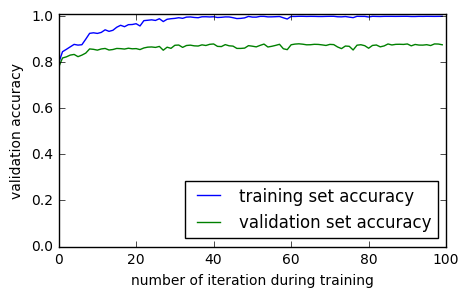

In [156]:
# plot the CNN training result
iteration = list(range(100))
plt.figure(figsize=(5,3))
plt.plot(iteration[0:100], acc_train[0:100], label="training set accuracy")
plt.plot(iteration[0:100], acc_valid[0:100], label="validation set accuracy")
plt.legend(loc=4)
plt.ylim([0,1.01])
plt.ylabel('validation accuracy')
plt.xlabel('number of iteration during training')
plt.savefig('CNN_accuracy.png')

In [157]:
# Create a confusion matrix to visualize the model predictions
prob = tf.nn.softmax(logits)
with tf.Session() as sess:
    saver.restore(sess, "./CNN_LeNet_preprocess_4.ckpt")
    test_accuracy = sess.run(
        accuracy,
        feed_dict={features: X_valid, labels: Valid_label, keep_prob: 1.0})
    Z = logits.eval(feed_dict={features: X_valid, labels: Valid_label, keep_prob: 1.0})
    probability = prob.eval(feed_dict={features: X_valid, labels: Valid_label, keep_prob: 1.0})
    y_pred = np.argmax(Z, axis = 1)


INFO:tensorflow:Restoring parameters from ./CNN_LeNet_preprocess_4.ckpt


In [191]:
def one_hot_decode(x):
    label = []
    for i in range(len(x)):
        label.append(np.where(x[i]==1)[0][0])
    return label

In [192]:
y_ground = one_hot_decode(Valid_label.astype(int))
conf_matrix = confusion_matrix(y_ground, list(y_pred))

In [193]:
conf_matrix

array([[2371,   82,   25,   22],
       [  64, 2210,  147,   79],
       [  31,  131,  319,   19],
       [  28,   84,   30,  358]])

In [198]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[2371   82   25   22]
 [  64 2210  147   79]
 [  31  131  319   19]
 [  28   84   30  358]]


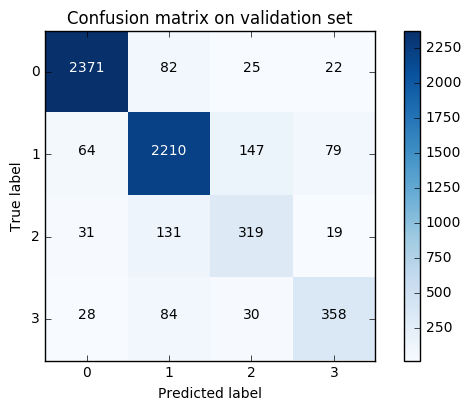

In [199]:
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(conf_matrix, classes=[0,1,2,3],
                      title='Confusion matrix without validation')

Confusion matrix, without normalization
[[2371   82   25   22]
 [  64 2210  147   79]
 [  31  131  319   19]
 [  28   84   30  358]]


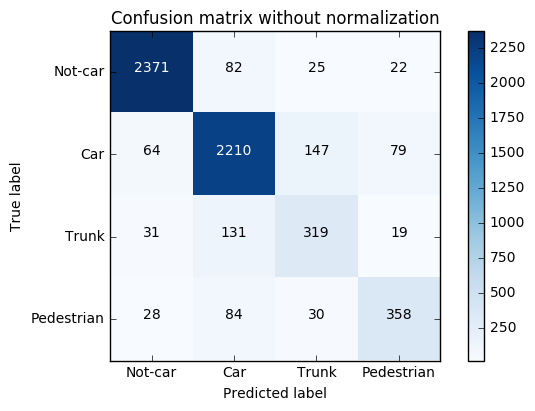

In [201]:
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(conf_matrix, classes=['Not-car', 'Car', 'Trunk', 'Pedestrian'],
                      title='Confusion matrix without normalization')

Normalized confusion matrix
[[ 0.9484  0.0328  0.01    0.0088]
 [ 0.0256  0.884   0.0588  0.0316]
 [ 0.062   0.262   0.638   0.038 ]
 [ 0.056   0.168   0.06    0.716 ]]


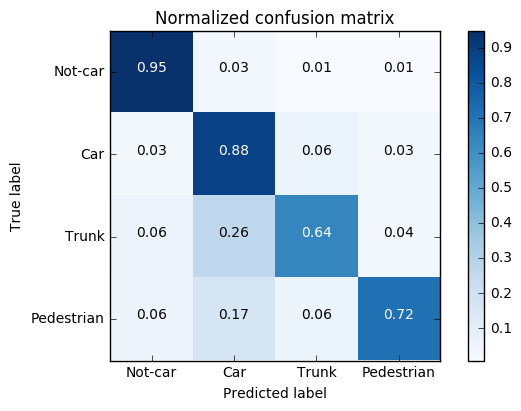

In [202]:
# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(conf_matrix, classes=['Not-car', 'Car', 'Trunk', 'Pedestrian'], normalize=True,
                      title='Normalized confusion matrix')

# Test the model using driving images

In [453]:
def draw_labeled_bboxes(img, label_1, label_2):
    # Iterate through all detected cars
    draw_img = np.copy(img)
    for car_number in range(1, label_1[1]+1):
        # Find pixels with each car_number label value
        nonzero = (label_1[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        #if bbox[1][0]-bbox[0][0] > 100 or bbox[1][1]-bbox[0][1] > 100:
        cv2.rectangle(draw_img, bbox[0], bbox[1], (0,0,255), 2)
    for car_number in range(1, label_2[1]+1):
        # Find pixels with each car_number label value
        nonzero = (label_2[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        #if bbox[1][0]-bbox[0][0] > 100 or bbox[1][1]-bbox[0][1] > 100:
        cv2.rectangle(draw_img, bbox[0], bbox[1], (0,255,0), 2)
    # Return the image
    return draw_img

In [410]:
# Define a function that takes an image, a list of sliding windows, 
# and optional color tuple and line thickness as inputs
# then draws boxes in that color on the output
def draw_initial_boxes(img, bboxes, label, prob, threshold, color=(0, 0, 255), thick=2):
    # Make a copy of the image
    box_1 = []
    box_2 = []
    box_3 = []
    draw_img = np.copy(img)
    # Iterate through the bounding boxes
    for bbox, i, p in zip(bboxes, label, prob):
        if i == 1 and p > threshold:
        # Draw a rectangle given bbox coordinates
            cv2.rectangle(draw_img, bbox[0], bbox[1], color, thick)
            box_1.append(bbox)
        if i == 2 and p > threshold:
        # Draw a rectangle given bbox coordinates
            cv2.rectangle(draw_img, bbox[0], bbox[1], (0, 255, 0), thick)
            box_2.append(bbox)
        #if i == 3 and p > threshold:
        # Draw a rectangle given bbox coordinates
            #cv2.rectangle(draw_img, bbox[0], bbox[1], (255, 0, 0), thick)
            #box_3.append(bbox)
    # Return the image copy with boxes drawn
    return draw_img, box_1, box_2, box_3

In [206]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

In [228]:
# load the new testing images
def read_image(path):
    data = []
    files = glob.glob(path)
    # prepare training dataset for non-cars
    for i in files:
        image = cv2.imread(i)
        data.append(image)
    data = np.array(data)
    return data

In [229]:
# The new images are briefly cropped and centered. They are saved in the folder "Test_image"
test_path = os.getcwd() + '/Test/*.JPG'
X_new = read_image(test_path)

In [230]:
X_new.shape

(8, 480, 640, 3)

In [285]:
X_new_N = preprocessing(X_new)
X_new_N = normalized_pixel(X_new_N)

<function matplotlib.pyplot.show>

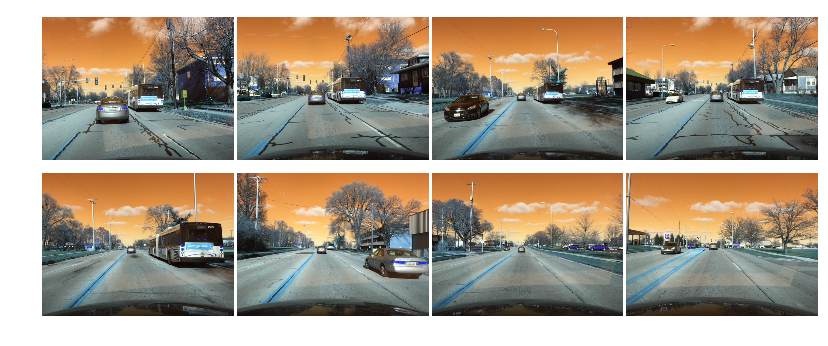

In [242]:
# see the new images 
fig, axs = plt.subplots(2, 4, figsize = (10, 4))
fig.subplots_adjust(hspace = .02, wspace = .02)
for i, ax in enumerate(axs.flatten()):
    if i < 8:
        #ax.set_title("New image: " + str(i))
        ax.imshow(X_new[i], cmap = 'gray')
        ax.axis("off")       
#fig.savefig('test_image.png')
plt.show

<function matplotlib.pyplot.show>

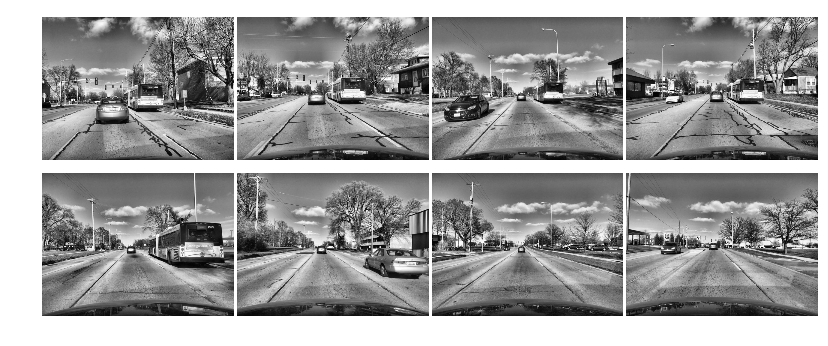

In [240]:
# see the new images 
fig, axs = plt.subplots(2, 4, figsize = (10, 4))
fig.subplots_adjust(hspace = .02, wspace = .02)
for i, ax in enumerate(axs.flatten()):
    if i < 8:
        #ax.set_title("New image: " + str(i))
        ax.imshow(X_new_N[i], cmap = 'gray')
        ax.axis("off")       
#fig.savefig('test_image.png')
plt.show

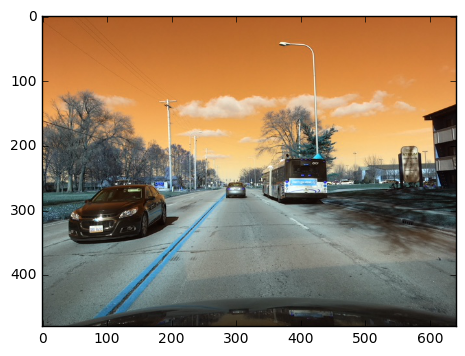

In [418]:
ind = 2
plt.imshow(X_new[ind])

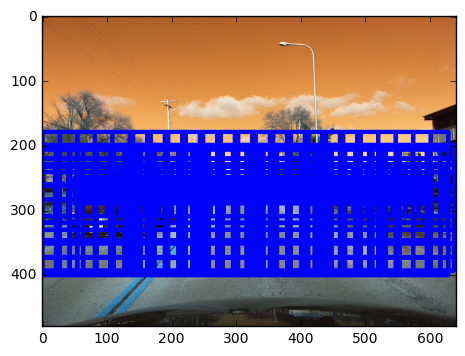

In [562]:
plt.imshow(aaa)

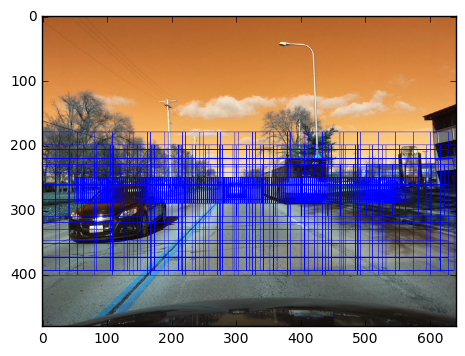

In [568]:
x_start = 0
x_stop = X_new.shape[2]
box_0 = slide_window(X_new[ind], [x_start+50,x_stop-50],[250, 290], (40,40), (0.9,0.9))
box_1 = slide_window(X_new[ind], [x_start,x_stop],[230, 320], (80,80), (0.75,0.75))
box_2 = slide_window(X_new[ind], [x_start,x_stop],[200, 400], (110,110), (0.8,0.8))
box_3 = slide_window(X_new[ind], [x_start,x_stop],[180, 410], (140,140), (0.8,0.8))
#box_4 = slide_window(test_image, [x_start,x_stop],[400, 1000], (600,600), (0.9,0.9))
box = box_0 + box_1 + box_2 + box_3
#box = box_0
aaa = draw_boxes(X_new[ind], box)
plt.imshow(aaa, cmap = 'gray')

In [436]:
test_pool = []
for i in box:
    sub_image = X_new_N[ind][i[0][1]:i[1][1],i[0][0]:i[1][0]]
    sub_image = cv2.resize(sub_image, (64, 64))
    test_pool.append(sub_image)
test_pool = np.array(test_pool)
#test_pool = test_pool.reshape((-1, 64*64*3))

In [437]:
test_pool.shape

(403, 64, 64)

In [438]:
# apply the tf.nn.top_k function to output the top-1 probability and corresponding indices
with tf.Session() as sess:
    saver.restore(sess, "./CNN_LeNet_preprocess_4.ckpt")
    Z = logits.eval(feed_dict={features: test_pool, keep_prob: 1.0})
    probability = prob.eval(feed_dict={features: test_pool, keep_prob: 1.0})
    top_1 = sess.run(tf.nn.top_k(tf.constant(probability), k = 1))

INFO:tensorflow:Restoring parameters from ./CNN_LeNet_preprocess_4.ckpt


In [439]:
print ('Top probability for the new images are: \n')
print (top_1.values)
print ('\nThe corresponding top 1 indices are: \n')
print (top_1.indices)

Top probability for the new images are: 

[[ 0.97832721]
 [ 0.94649029]
 [ 0.99222422]
 [ 0.97788846]
 [ 0.99997509]
 [ 0.99999785]
 [ 0.99999988]
 [ 0.99999964]
 [ 0.99630582]
 [ 0.99990022]
 [ 0.99998498]
 [ 0.99999809]
 [ 0.94679379]
 [ 0.57376039]
 [ 0.98948377]
 [ 0.99996948]
 [ 0.96343672]
 [ 0.99999845]
 [ 0.99522567]
 [ 0.99849081]
 [ 0.9934321 ]
 [ 0.91246575]
 [ 0.89613301]
 [ 0.99424815]
 [ 0.66609186]
 [ 0.99690932]
 [ 0.741458  ]
 [ 0.98537481]
 [ 0.99948418]
 [ 0.99999952]
 [ 0.99976259]
 [ 0.65142882]
 [ 0.70526338]
 [ 0.62612474]
 [ 0.89507699]
 [ 1.        ]
 [ 0.8384701 ]
 [ 0.64915538]
 [ 0.99988985]
 [ 0.590424  ]
 [ 0.99998951]
 [ 0.99765128]
 [ 1.        ]
 [ 0.97166663]
 [ 0.99983644]
 [ 0.89513004]
 [ 1.        ]
 [ 0.99999118]
 [ 0.97190607]
 [ 1.        ]
 [ 1.        ]
 [ 1.        ]
 [ 1.        ]
 [ 1.        ]
 [ 1.        ]
 [ 1.        ]
 [ 1.        ]
 [ 1.        ]
 [ 0.92637038]
 [ 0.99999726]
 [ 0.9999038 ]
 [ 1.        ]
 [ 1.        ]
 [ 1.        

In [440]:
threshold = 0.90

In [458]:
img_pred, heat_box_1, heat_box_2, heat_box_3 = draw_initial_boxes(X_new[ind], box, top_1.indices, top_1.values, threshold)

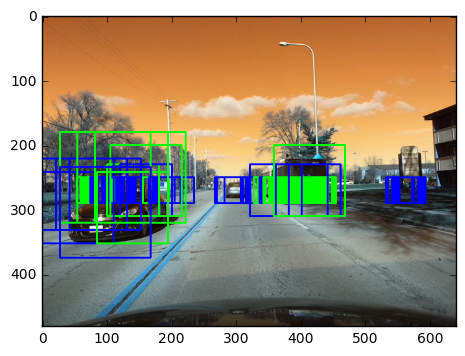

In [459]:
plt.imshow(img_pred, cmap ='gray')


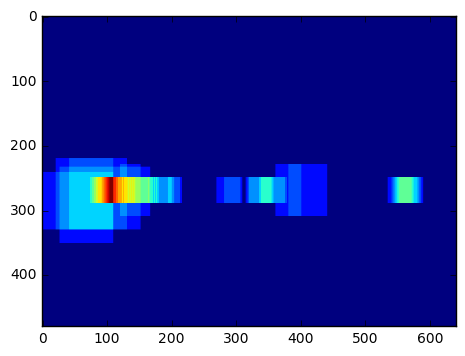

In [466]:
# determine the cars box
heat_car = np.zeros_like(X_new_N[ind]).astype(np.float32)
heat_car = add_heat(heat_car, heat_box_1)
# Apply threshold to help remove false positives
heat_car = apply_threshold(heat_car,1)
plt.imshow(heat_car)
#plt.savefig('3_layer_Car_2_NewSet_2.png')

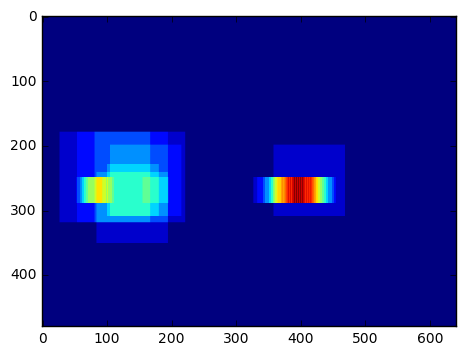

In [467]:
# determine the trunk box
heat_t = np.zeros_like(X_new_N[ind]).astype(np.float32)
heat_t = add_heat(heat_t, heat_box_2)
# Apply threshold to help remove false positives
heat_t = apply_threshold(heat_t,0)
plt.imshow(heat_t)
#plt.savefig('3_layer_Car_2_NewSet_2.png')

In [476]:
np.max(labels_car[0])

4

In [ ]:
# Find final boxes from heatmap using label function
labels_car = label(heat_car)
labels_t = label(heat_t)

In [477]:
# find overlapped area:
label_logit = labels_car[0] * labels_t[0]

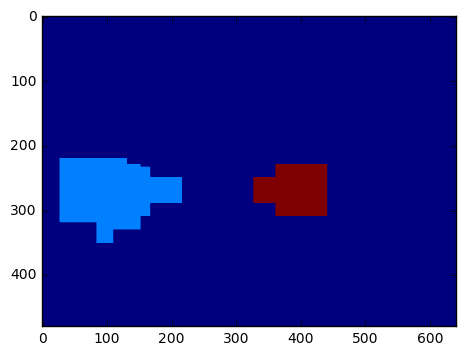

In [478]:
plt.imshow(label_logit)

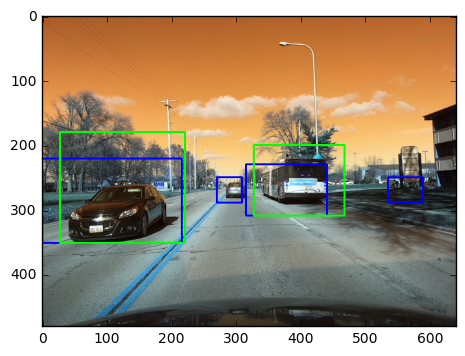

In [468]:
draw_img = draw_labeled_bboxes(X_new[ind], labels_car, labels_t)
plt.imshow(draw_img)
#plt.savefig('3_layer_Car_2_NewSet_1.png')

In [247]:
i=1000
test_image_path = 'object-detection-dataset_1/' + Car_train_label.iloc[i]['Frame']
test_image = cv2.imread(test_image_path)
plt.imshow(test_image[:,:,:])

NameError: name 'test_new_path' is not defined

In [412]:
test_image.shape

(1200, 1920, 3)

In [627]:
x_start = 0
x_stop = test_image.shape[1]
box_0 = slide_window(test_image, [x_start,x_stop],[500, 700], (200,200), (0.8,0.8))
box_1 = slide_window(test_image, [x_start,x_stop],[500, 700], (100,100), (0.8,0.8))
box_2 = slide_window(test_image, [x_start,x_stop],[400, 1000], (300,300), (0.5,0.5))
box_3 = slide_window(test_image, [x_start,x_stop],[400, 1000], (400,400), (0.8,0.8))
box_4 = slide_window(test_image, [x_start,x_stop],[400, 1000], (600,600), (0.8,0.8))
box = box_0 + box_1 + box_3
#box = box_1 + box_2 + box_3 + box_4
#aaa = draw_boxes(test_image, box)
#plt.imshow(aaa)

In [458]:
test_pool = []
for i in box:
    sub_image = test_image[i[0][1]:i[1][1],i[0][0]:i[1][0],:]
    sub_image = cv2.resize(sub_image, (64, 64))
    test_pool.append(sub_image)
test_pool = np.array(test_pool, dtype = 'float32')/255
test_pool = test_pool.reshape((-1, 64*64*3))

In [459]:
test_pool.shape

(681, 12288)

In [460]:
with tf.Session() as sess:
    saver.restore(sess, "./3_layer_NN_New_Set.ckpt")
    Z = logits.eval(feed_dict={features: test_pool})
    y_pred = np.argmax(Z, axis = 1)

INFO:tensorflow:Restoring parameters from ./3_layer_NN_New_Set.ckpt


In [462]:
aaa, heat_box_1, heat_box_2, heat_box_3 = draw_initial_boxes(test_image, box, y_pred)

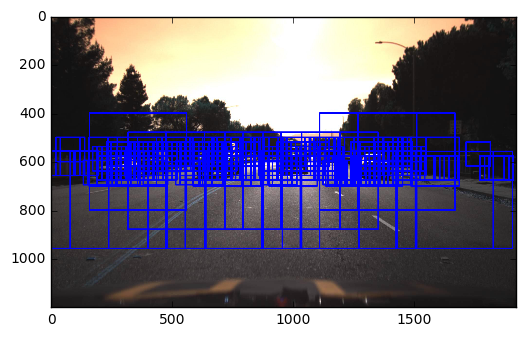

In [471]:
plt.imshow(aaa)
plt.savefig('3_layer_Car_2_NewSet_0.png')

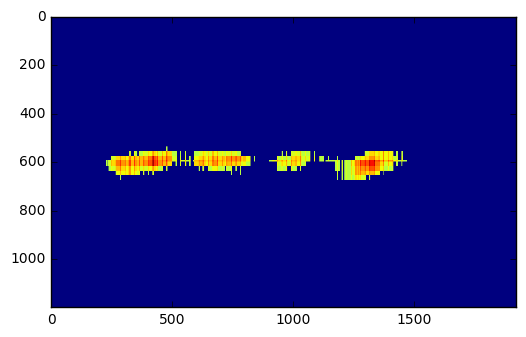

In [470]:
# determine the cars box
heat = np.zeros_like(test_image[:,:,0]).astype(np.float32)
heat = add_heat(heat, heat_box_1)
# Apply threshold to help remove false positives
heat = apply_threshold(heat,15)
plt.imshow(heat)
plt.savefig('3_layer_Car_2_NewSet_2.png')

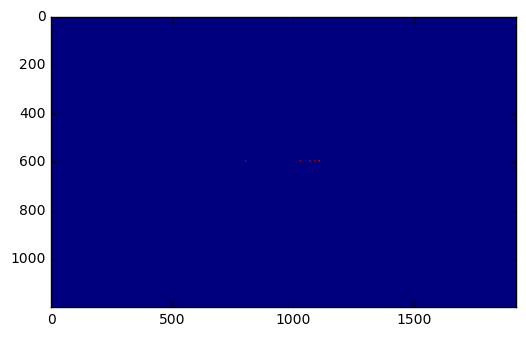

In [467]:
# determine the truck box
heat = np.zeros_like(test_image[:,:,0]).astype(np.float32)
heat = add_heat(heat, heat_box_2)
# Apply threshold to help remove false positives
heat = apply_threshold(heat,15)
plt.imshow(heat)

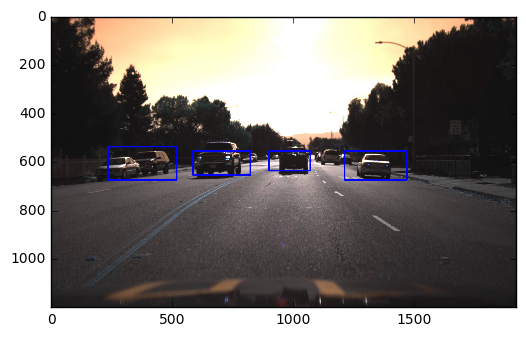

In [472]:
# Find final boxes from heatmap using label function
labels = label(heat)
draw_img = draw_labeled_bboxes(test_image, labels)
plt.imshow(draw_img)
plt.savefig('3_layer_Car_2_NewSet_1.png')

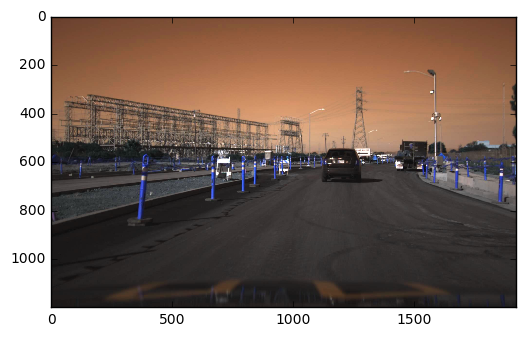

In [357]:
plt.imshow(test_image)